### METRICS EXPERIMENTATION

In [77]:
import os 
import sys
import argparse
import evolocity as evo
import anndata
import pandas as pd
import numpy as np
import torch
import scanpy as sc
import plotly.express as px


#### Hyperparamters to Change

In [2]:
### v-gene-family level

dataset = "OVA_mouse"
mode = "full_VDJ"
group = "v_gene_family"
include_germline = False
no_IGM = True

### specific v-gene level

dataset_specific = "OVA_mouse"
group_specific = "v_gene"
mode_specific = "v_gene_only"
include_germline_specific = True
unrecombined = True

### Initialization - V-gene family level

In [40]:
import pickle as pkl

subset_level = "v_gene_family"

if include_germline:
    file_path = f"../../../data/{dataset}/evo_velo_{group}_germline.pkl"
else:
    file_path = f"../../../data/{dataset}/evo_velo_{group}.pkl"

with open(file_path,"rb") as file:
    model_dict = pkl.load(file)

In [4]:
file_path

'../../../data/OVA_mouse/evo_velo_v_gene_family.pkl'

### Initialization - Specific V-gene level

In [29]:
import pickle as pkl

subset_level = "specific_v_gene"

if include_germline_specific and unrecombined == False:
    file_path = f"../../../data/{dataset_specific}/evo_velo_{group_specific}_germline.pkl"
elif include_germline_specific and unrecombined == True:
    file_path = f"../../../data/{dataset_specific}/evo_velo_{group_specific}_unrecombined_germline.pkl"
else:
    file_path = f"../../../data/{dataset_specific}/evo_velo_{group_specific}.pkl"

with open(file_path,"rb") as file:
    model_dict_specific = pkl.load(file)

In [17]:
file_path

'../../../data/OVA_mouse/evo_velo_v_gene_unrecombined_germline.pkl'

### Which level to analyse

In [41]:
model_names = ["ablang","sapiens","protbert","ESM"]
data = pd.read_csv(os.path.join("..","..","..","data",dataset,"vdj_evolike_combine.csv"))

if subset_level == "v_gene_family":
    current_model = model_dict
    del(model_dict)
elif subset_level == "specific_v_gene":
    current_model = model_dict_specific
    del(model_dict_specific)

#### IgM-IgG/IgG-IgM velocities

In [61]:
output_table = []

isotype_1 = "IGHM"
isotype_2 = "IGHG"

sub_groups = list(np.sort(np.array(list(current_model[model].keys()))))

# if subset_level == "v_gene_family":
#     sub_groups = ["IGHV1","IGHV2","IGHV3"]
# else:
#     sub_groups = ["IGHV1-4","IGHV3-1","IGHV9-3"]

for model in model_names:
    for sub_group in sub_groups:
   
        metadata = current_model[model][sub_group].obs
        velocity_graph = current_model[model][sub_group].uns["velocity_graph"]
        velocity_graph_neg = current_model[model][sub_group].uns["velocity_graph_neg"] 
        
        isotype_1_indices = list(metadata.loc[metadata["isotype"] ==  isotype_1,:].index.astype(int))
        isotype_2_indices = list(metadata.loc[metadata["isotype"] ==  isotype_2,:].index.astype(int))
        
        velo_sum = 0
        non_zero_velos = 0
        
        for i in isotype_1_indices:
            velo_sum += velocity_graph[i, isotype_2_indices].sum() + velocity_graph_neg[i, isotype_2_indices].sum()
            non_zero_velos += (velocity_graph[i, isotype_2_indices] != 0).sum() + (velocity_graph_neg[i, isotype_2_indices] != 0).sum()
        
        if non_zero_velos > 0:
            velo_avg_1_to_2 = velo_sum/non_zero_velos
        else:
            velo_avg_1_to_2 = 0
        
        velo_sum = 0
        non_zero_velos = 0
        
        for i in isotype_2_indices:
            velo_sum += velocity_graph[i, isotype_1_indices].sum() + velocity_graph_neg[i, isotype_1_indices].sum()
            non_zero_velos += (velocity_graph[i,isotype_1_indices] != 0).sum() + (velocity_graph_neg[i, isotype_1_indices] != 0).sum()
            
        if non_zero_velos > 0:
            velo_avg_2_to_1 = velo_sum/non_zero_velos
        else:
            velo_avg_2_to_1 = 0

        velo_max = max(velocity_graph.max(),-velocity_graph_neg.min())
        output_table.append({"model":model,f"{group}":sub_group, f"Avg_{isotype_1}_to_{isotype_2}":velo_avg_1_to_2, 
                             f"Avg_{isotype_2}_to_{isotype_1}":velo_avg_2_to_1, })
        
output_table = pd.DataFrame(output_table)
melted_output_table = output_table.melt(id_vars=['model','v_gene_family'], value_vars=[f"Avg_{isotype_1}_to_{isotype_2}", f"Avg_{isotype_2}_to_{isotype_1}"], 
              var_name='direction', value_name='velocity')

In [62]:
output_table

,model,v_gene_family,Avg_IGHM_to_IGHG,Avg_IGHG_to_IGHM
0,ablang,IGHV1,-0.052313,0.118246
1,ablang,IGHV10,0.073359,0.193983
2,ablang,IGHV11,-0.864808,0.750959
3,ablang,IGHV12,-0.276744,0.598230
4,ablang,IGHV13,-0.113773,0.101357
5,ablang,IGHV14,-0.013848,0.075123
6,ablang,IGHV2,-0.144147,0.190757
7,ablang,IGHV3,-0.071866,0.170190
8,ablang,IGHV4,-0.150803,0.334256
9,ablang,IGHV5,-0.057642,0.135606


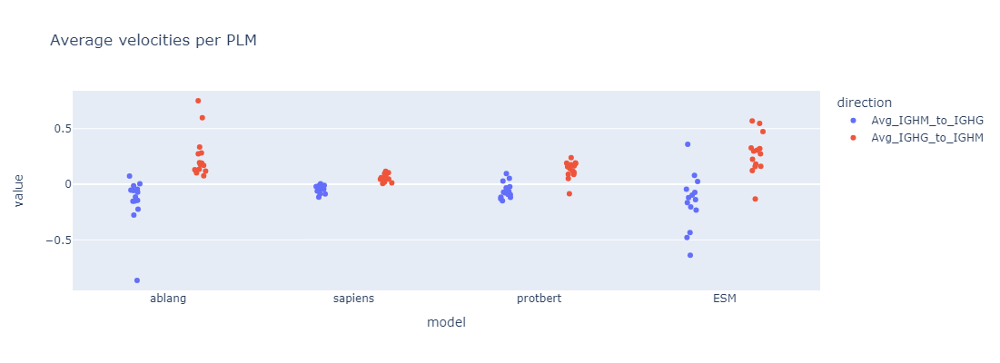

In [65]:
import plotly.express as px

fig = px.strip(
    data_frame = melted_output_table,
    # points = "all",
    # facet_col = "v_gene_family",
    # facet_col_wrap = 3,
    x = "model",
    color="direction",
    y = ["velocity"],
    # opacity = 0.9,
    orientation = "v",
    # barmode = 'group',
    title='Average velocities per PLM',
    # text_auto="0.2f"
)

fig.update_layout(height = 400)
# fig.update_traces(textfont_size=10, textangle=0, cliponaxis=False)

fig.show()

#### In/Out Degree Difference Per Isotype

In [32]:
from scipy.sparse import coo_matrix

output_table = []

for model in model_names:
    for sub_group in list(np.sort(np.array(list(current_model[model].keys())))):
        
        metadata = current_model[model][sub_group].obs
        velocity_graph = current_model[model][sub_group].uns["velocity_graph"]
        velocity_graph_neg = current_model[model][sub_group].uns["velocity_graph_neg"] 

        coo_pos = coo_matrix(velocity_graph.toarray())
        coo_pos = list(zip(coo_pos.row, coo_pos.col, coo_pos.data))
        coo_pos = pd.DataFrame(coo_pos, columns=["row","col","val"])

        coo_neg = coo_matrix(velocity_graph_neg.toarray())
        coo_neg = list(zip(coo_neg.row, coo_neg.col, coo_neg.data))
        coo_neg = pd.DataFrame(coo_neg, columns=["row","col","val"])
        
        IgM_indices = list(metadata.loc[metadata["isotype"] ==  "IGHM",:].index.astype(int))
        IgG_indices = list(metadata.loc[metadata["isotype"] ==  "IGHG",:].index.astype(int))
        IgA_indices = list(metadata.loc[metadata["isotype"] ==  "IGHA",:].index.astype(int))

        for i in IgM_indices:
            in_degrees = (coo_neg.loc[coo_neg["row"] == i, "val"] < 0).sum()
            out_degrees = (coo_pos.loc[coo_pos["row"] == i, "val"] > 0).sum()
            sink_factor = in_degrees - out_degrees
            # if True or sink_factor != 0:
            output_table.append({"index":i,"barcode":metadata["barcode"][i],"model":f"{model}", "isotype":"IGHM", "sample_id":metadata["sample_id"][i], 
                                     "v_gene_family":sub_group, "in_degree":in_degrees, "out_degree":out_degrees, "sink_factor":sink_factor})

        for i in IgG_indices:
            in_degrees = (coo_neg.loc[coo_neg["row"] == i, "val"] < 0).sum()
            out_degrees = (coo_pos.loc[coo_pos["row"] == i, "val"] > 0).sum()
            sink_factor = in_degrees - out_degrees
            # if True or sink_factor != 0:
            output_table.append({"index":i,"barcode":metadata["barcode"][i],"model":f"{model}", "isotype":"IGHG", "sample_id":metadata["sample_id"][i],
                                     "v_gene_family":sub_group, "in_degree":in_degrees, "out_degree":out_degrees, "sink_factor":sink_factor})

        for i in IgA_indices:
            in_degrees = (coo_neg.loc[coo_neg["row"] == i, "val"] < 0).sum()
            out_degrees = (coo_pos.loc[coo_pos["row"] == i, "val"] > 0).sum()
            sink_factor = in_degrees - out_degrees
            # if True or sink_factor != 0:
            output_table.append({"index":i,"barcode":metadata["barcode"][i],"model":f"{model}", "isotype":"IGHA", "sample_id":metadata["sample_id"][i],
                                     "v_gene_family":sub_group, "in_degree":in_degrees, "out_degree":out_degrees, "sink_factor":sink_factor})


output_table = pd.DataFrame(output_table)             
output_table = output_table.loc[output_table["barcode"] != "germline", :]

In [33]:
output_table

,index,barcode,model,isotype,sample_id,v_gene_family,in_degree,out_degree,sink_factor
0,2,AAACCTGAGTGAAGTT,ablang,IGHM,s1,IGHV1,27,22,5
1,6,AAACCTGTCGGAGGTA,ablang,IGHM,s1,IGHV1,10,39,-29
2,12,AAAGATGCAAGCTGGA,ablang,IGHM,s1,IGHV1,43,6,37
3,24,AACACGTAGTCCCACG,ablang,IGHM,s1,IGHV1,17,32,-15
4,32,AACCGCGGTACTTGAC,ablang,IGHM,s1,IGHV1,14,35,-21
...,...,...,...,...,...,...,...,...,...
23515,386,GCGCAGTTCAGGATCT,ESM,IGHA,s5,IGHV9,1,48,-47
23516,388,GGACATTCATGGTAGG,ESM,IGHA,s5,IGHV9,29,20,9
23517,393,GGGACCTGTACAGTGG,ESM,IGHA,s5,IGHV9,2,47,-45
23518,395,GTATCTTCACCAGGTC,ESM,IGHA,s5,IGHV9,14,35,-21


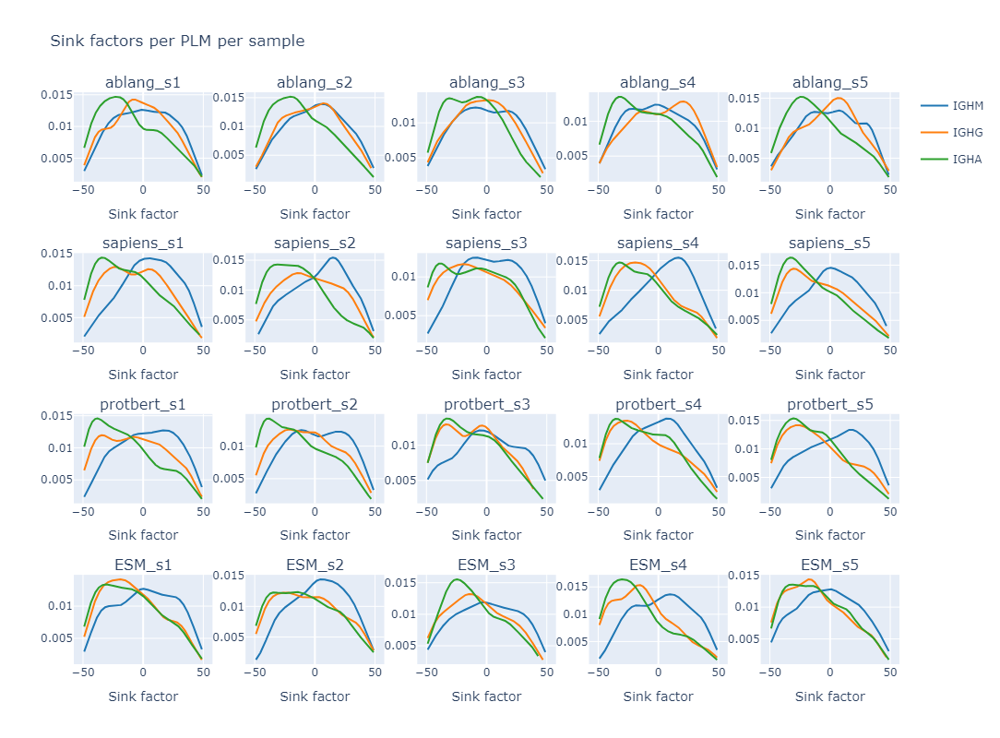

In [34]:
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.graph_objects as go

cols = len(output_table["sample_id"].unique())
rows = len(model_names)
main_fig = make_subplots(rows,cols, subplot_titles=[" "] * rows * cols)

for i,sample in enumerate(output_table["sample_id"].unique()):

    for k, model in enumerate(model_names):

        output_table_subset = output_table.loc[(output_table["sample_id"] == sample) & (output_table["model"] == model),:]

    
        x1 = output_table_subset.loc[output_table["isotype"] == "IGHM","sink_factor"]
        x2 = output_table_subset.loc[output_table["isotype"] == "IGHG","sink_factor"]
        x3 = output_table_subset.loc[output_table["isotype"] == "IGHA","sink_factor"]

        if x1.shape[0] == 0 or x2.shape[0] == 0 or x3.shape[0] == 0:
            print(f"{sample}_{model}")
            continue
        
        fig = ff.create_distplot([x1,x2,x3], group_labels = ["IGHM","IGHG","IGHA"],show_hist=False, bin_size=2)
    
        if i >= 1 or k >=1:
            for j in range(3):
                fig.data[j]["showlegend"] = False
        
        # fig.update_layout(height = 1000, xaxis_title="Sink Factor")
        # fig.update_traces(textfont_size=10, cliponaxis=False)
        main_fig.add_traces(fig.data, rows=k+1, cols=i+1)
        main_fig.update_xaxes(title_text="Sink factor", row=k+1, col=i+1)
        main_fig.layout.annotations[k*cols + i].update(text=f"{model}_{sample}")


main_fig.update_layout(height = rows * 200, width = cols * 200, title_text="Sink factors per PLM per sample")
main_fig.show()

#### Velocity vs change in SHM_count

In [11]:
from scipy.sparse import coo_matrix
output_table = []

model = "ESM"
group = "v_gene_family"

for model in ["ESM"]:
    for sub_group in list(current_model[model].keys()):
        
        metadata = current_model[model][sub_group].obs
        velocity_graph = current_model[model][sub_group].uns["velocity_graph"]
        velocity_graph_neg = current_model[model][sub_group].uns["velocity_graph_neg"] 

        coo_pos = coo_matrix(velocity_graph.toarray())
        coo_pos = list(zip(coo_pos.row, coo_pos.col, coo_pos.data))
        coo_pos = pd.DataFrame(coo_pos, columns=["row","col","val"])

        coo_neg = coo_matrix(velocity_graph_neg.toarray())
        coo_neg = list(zip(coo_neg.row, coo_neg.col, coo_neg.data))
        coo_neg = pd.DataFrame(coo_neg, columns=["row","col","val"])

        for row in range(coo_pos.shape[0]):
                i = coo_pos["row"][row]
                j = coo_pos["col"][row]
                val = coo_pos["val"][row]
                if velocity_graph[i,j] != 0:
                    SHM_diff = metadata["SHM_count"][j] - metadata["SHM_count"][i]
                    if SHM_diff != 0:
                        output_table.append({"model":model,f"{group}":sub_group,"evo_velocity":val,"SHM_diff":SHM_diff})

        # for row in range(coo_neg.shape[0]):
        #         i = coo_neg["row"][row]
        #         j = coo_neg["col"][row]
        #         val = coo_neg["val"][row]
        #         if velocity_graph_neg[i,j] != 0:
        #             SHM_diff_rev = metadata["SHM_count"][i] - metadata["SHM_count"][j]
        #             output_table.append({"model":model,f"{group}":group,"evo_velocity":-val,"SHM_diff":SHM_diff_rev})
        
output_table = pd.DataFrame(output_table).drop_duplicates().reset_index(drop=True) 

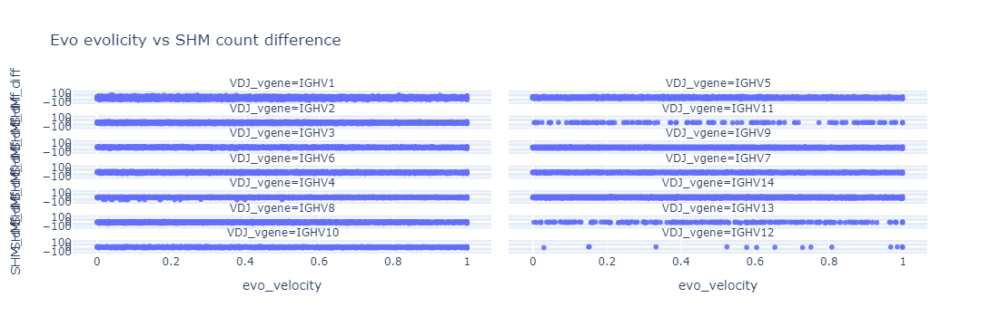

In [12]:
import plotly.express as px

fig = px.scatter(
    data_frame = output_table,
    facet_col = "VDJ_vgene",
    facet_col_wrap = 2,
    x = "evo_velocity",
    y = "SHM_diff",
    opacity = 0.9,
    orientation = "v",
    title='Evo evolicity vs SHM count difference',
)

fig.update_layout(height = 1000)

fig.show()

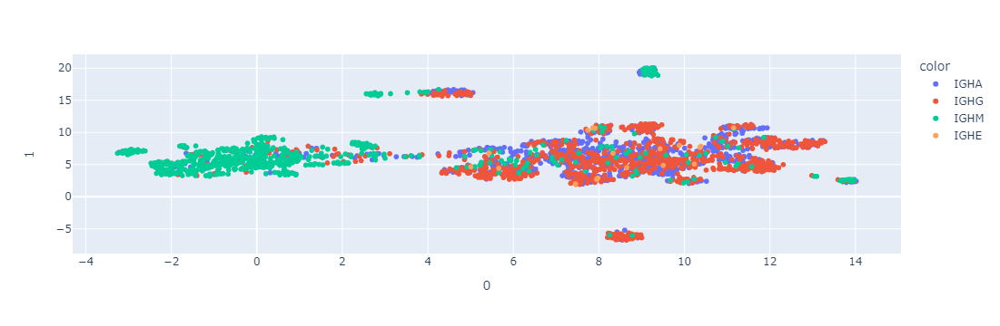

In [44]:
px.scatter(pd.DataFrame(current_model["ablang"]["IGHV1"].obsm["X_umap"]), x = 0, y = 1, color = current_model["ablang"]["IGHV1"].obs["isotype"]) 

#### Shared Nearest Neighbours

In [37]:
from scipy.sparse import coo_matrix

output_table = []

model_pairs = [("ESM","protbert"),("ESM","sapiens"),("sapiens","protbert"),("ESM","ablang"),("sapiens","ablang"),("protbert","ablang")]
sub_group = "IGHV1"

for model_pair in model_pairs:

    model_1 = model_pair[0]
    model_2 = model_pair[1]
    
    n_sequences = len(current_model[model_1][sub_group].obs["seq"])
    
    metadata_1 = current_model[model_1][sub_group].obs
    nn_graph_1 = current_model[model_1][sub_group].uns["neighbors"]["indices"]
    
    metadata_2 = current_model[model_2][sub_group].obs
    nn_graph_2 = current_model[model_2][sub_group].uns["neighbors"]["indices"]

    for i in range(n_sequences):
        
        shared_nn = len(list(set(nn_graph_1[i,:]).intersection(set(nn_graph_2[i,:]))))
        output_table.append({"model_pair":f"{model_1}_{model_2}", f"{group}":sub_group, "shared_nn":shared_nn})

output_table = pd.DataFrame(output_table)

In [15]:
output_table

,model_pair,VDJ_vgene,shared_nn
0,ESM_protbert,IGHV1,24
1,ESM_protbert,IGHV1,14
2,ESM_protbert,IGHV1,21
3,ESM_protbert,IGHV1,9
4,ESM_protbert,IGHV1,24
...,...,...,...
16201,protbert_ablang,IGHV1,13
16202,protbert_ablang,IGHV1,5
16203,protbert_ablang,IGHV1,10
16204,protbert_ablang,IGHV1,10


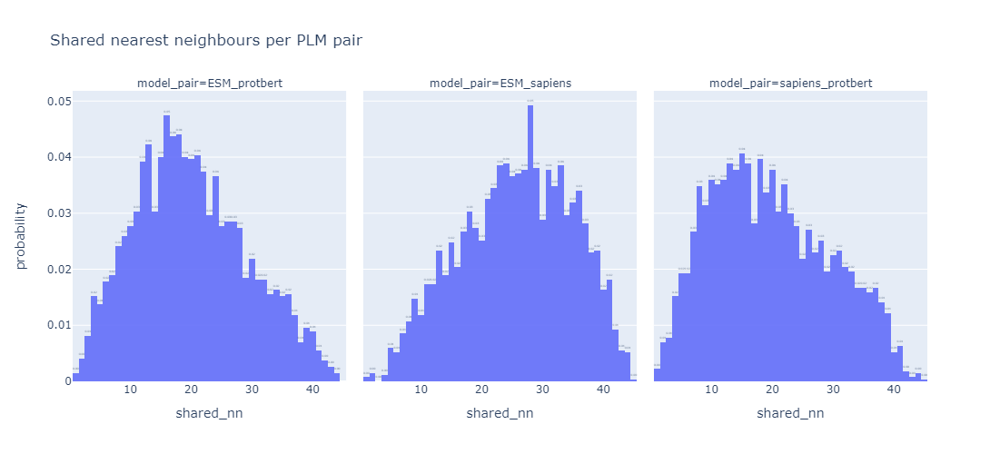

In [36]:
fig = px.histogram(
    data_frame = output_table,
    facet_col = "model_pair",
    facet_col_wrap = 3,
    histnorm="probability",
    x = "shared_nn",
    opacity = 0.9,
    orientation = "v",
    barmode = 'group',
    title='Shared nearest neighbours per PLM pair',
    text_auto="0.2f"
)

fig.update_layout(height = 500)
fig.update_traces(textfont_size=10, textangle=0, textposition="outside", cliponaxis=False)

fig.show()

#### Average Velocity per Sequence comparison between PLMs

In [17]:
from scipy.sparse import coo_matrix

output_table = []

model_pairs = [("ESM","protbert"),("ESM","sapiens"),("sapiens","protbert"),("ESM","ablang"),("sapiens","ablang"),("protbert","ablang")]
sub_group = "IGHV1"

for model_pair in model_pairs:

    model_1 = model_pair[0]
    model_2 = model_pair[1]
    
    n_sequences = len(current_model[model_1][sub_group].obs["seq"])
    
    metadata_1 = current_model[model_1][sub_group].obs
    velocity_graph_1 = current_model[model_1][sub_group].uns["velocity_graph"]
    velocity_graph_neg_1 = current_model[model_1][sub_group].uns["velocity_graph_neg"]
    
    metadata_2 = current_model[model_2][sub_group].obs
    velocity_graph_2 = current_model[model_2][sub_group].uns["velocity_graph"]
    velocity_graph_neg_2 = current_model[model_2][sub_group].uns["velocity_graph_neg"]

    for i in range(n_sequences):
        
        velo_sum_1 = velocity_graph_1[i, :].sum() + velocity_graph_neg_1[i,].sum()
        non_zero_velos_1 = (velocity_graph_1[i, :] != 0).sum() + (velocity_graph_neg_1[i,:] != 0).sum()
        if non_zero_velos_1 > 0:
            average_velo_1 = velo_sum_1/non_zero_velos_1
        else:
            average_velo_1 = 0

        velo_sum_2 = velocity_graph_2[i, :].sum() + velocity_graph_neg_2[i,].sum()
        non_zero_velos_2 = (velocity_graph_2[i, :] != 0).sum() + (velocity_graph_neg_2[i,:] != 0).sum()
        if non_zero_velos_2 > 0:
            average_velo_2 = velo_sum_2/non_zero_velos_2
        else:
            average_velo_2 = 0
            
        output_table.append({"model_pair":f"{model_1}_{model_2}", f"{group}":sub_group, 
                            "isotype":metadata_1["isotype"][i], "average_velocity_1":average_velo_1, "average_velocity_2":average_velo_2})

    output_table = pd.DataFrame(output_table)
    
    if "rank_average_velocity_1" not in output_table.columns: 
        output_table["rank_average_velocity_1"] = list(output_table["average_velocity_1"].rank(ascending = False))
        output_table["rank_average_velocity_2"] = list(output_table["average_velocity_2"].rank(ascending = False))
    else:
        select_model_pair = output_table["model_pair"] == f"{model_pair[0]}_{model_pair[1]}"
        output_table.loc[select_model_pair,"rank_average_velocity_1"] = list(output_table.loc[select_model_pair,"average_velocity_1"].rank(ascending = False))
        output_table.loc[select_model_pair,"rank_average_velocity_2"] = list(output_table.loc[select_model_pair,"average_velocity_2"].rank(ascending = False))

    output_table = output_table.to_dict(orient="records")

output_table = pd.DataFrame(output_table)

In [18]:
output_table

,model_pair,VDJ_vgene,isotype,average_velocity_1,average_velocity_2,rank_average_velocity_1,rank_average_velocity_2
0,ESM_protbert,IGHV1,IGHA,-0.393861,0.062704,2366.0,1098.0
1,ESM_protbert,IGHV1,IGHG,0.039508,0.129754,1413.0,763.0
2,ESM_protbert,IGHV1,IGHM,0.197029,-0.285242,983.0,2534.0
3,ESM_protbert,IGHV1,IGHG,0.640951,0.157792,149.0,650.0
4,ESM_protbert,IGHV1,IGHG,-0.249050,0.061584,2112.0,1100.0
...,...,...,...,...,...,...,...
16201,protbert_ablang,IGHV1,IGHM,-0.354309,-0.360062,2619.0,2429.0
16202,protbert_ablang,IGHV1,IGHA,0.049171,0.289095,1170.0,653.0
16203,protbert_ablang,IGHV1,IGHA,-0.041226,0.130351,1639.0,1093.0
16204,protbert_ablang,IGHV1,IGHA,0.066027,-0.085123,1084.0,1744.0


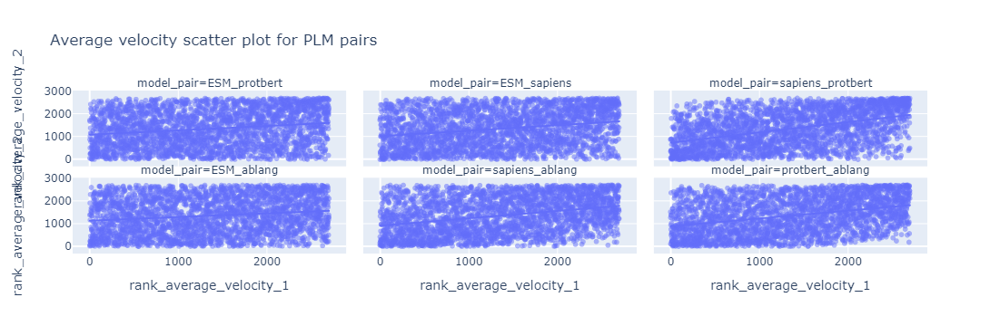

In [19]:
import plotly.express as px

fig = px.scatter(
    data_frame = output_table,
    facet_col = "model_pair",
    facet_col_wrap = 3,
    x = "rank_average_velocity_1",
    y = "rank_average_velocity_2",
    trendline="ols",
    # color="isotype",
    # trendline_color_override="red",
    opacity = 0.5,
    orientation = "v",
    title='Average velocity scatter plot for PLM pairs',
)

fig.update_layout(height = 500)

fig.show()

In [20]:
from scipy.sparse import coo_matrix

output_table = []

model_pairs = [("ESM","protbert"),("ESM","sapiens"),("sapiens","protbert"),("ESM","ablang"),("sapiens","ablang"),("protbert","ablang")]
sub_group = "IGHV1"

for model_pair in model_pairs:

    model_1 = model_pair[0]
    model_2 = model_pair[1]
    
    n_sequences = len(current_model[model_1][sub_group].obs["seq"])
    
    metadata_1 = current_model[model_1][sub_group].obs
    velocity_graph_1 = current_model[model_1][sub_group].uns["velocity_graph"]
    velocity_graph_neg_1 = current_model[model_1][sub_group].uns["velocity_graph_neg"]
    agg_velocity_graph_1 = velocity_graph_1 + velocity_graph_neg_1
    agg_velocity_graph_1 = agg_velocity_graph_1.toarray().flatten().squeeze().tolist()
    
    metadata_2 = current_model[model_2][sub_group].obs
    velocity_graph_2 = current_model[model_2][sub_group].uns["velocity_graph"]
    velocity_graph_neg_2 = current_model[model_2][sub_group].uns["velocity_graph_neg"]
    agg_velocity_graph_2 = velocity_graph_2 + velocity_graph_neg_2
    agg_velocity_graph_2 = agg_velocity_graph_2.toarray().flatten().squeeze().tolist()
    
    temp_table = pd.DataFrame()
    temp_table[f"velocities_model_1"] = agg_velocity_graph_1
    temp_table[f"velocities_model_2"] = agg_velocity_graph_2
    temp_table["model_pair"] = f"{model_1}_{model_2}"
    temp_table[f"{group}"] = sub_group

    
    output_table.append({"model_pair":f"{model_1}_{model_2}", f"{group}":sub_group,"corr_coef": temp_table[f"velocities_model_1"].corr(temp_table[f"velocities_model_2"])})

output_table = pd.DataFrame(output_table)

In [21]:
output_table

,model_pair,VDJ_vgene,corr_coef
0,ESM_protbert,IGHV1,0.116217
1,ESM_sapiens,IGHV1,0.163229
2,sapiens_protbert,IGHV1,0.286409
3,ESM_ablang,IGHV1,0.098493
4,sapiens_ablang,IGHV1,0.182056
5,protbert_ablang,IGHV1,0.191318


### SHM count vs sink factor


In [44]:
from scipy.sparse import coo_matrix

output_table = []
corr_table = []

if subset_level == "v_gene_family":
    sub_groups = ["IGHV1"]
else:
    sub_groups = ["IGHV1-4","IGHV3-1","IGHV9-3"]

for model in model_names:
    for sub_group in sub_groups:
        
        metadata = current_model[model][sub_group].obs
        velocity_graph = current_model[model][sub_group].uns["velocity_graph"]
        velocity_graph_neg = current_model[model][sub_group].uns["velocity_graph_neg"] 

        coo_pos = coo_matrix(velocity_graph.toarray())
        coo_pos = list(zip(coo_pos.row, coo_pos.col, coo_pos.data))
        coo_pos = pd.DataFrame(coo_pos, columns=["row","col","val"])

        coo_neg = coo_matrix(velocity_graph_neg.toarray())
        coo_neg = list(zip(coo_neg.row, coo_neg.col, coo_neg.data))
        coo_neg = pd.DataFrame(coo_neg, columns=["row","col","val"])

        for i in range(metadata.shape[0]):
            in_degrees = (coo_neg.loc[coo_neg["row"] == i, "val"] < 0).sum()
            out_degrees = (coo_pos.loc[coo_pos["row"] == i, "val"] > 0).sum()
            sink_factor = in_degrees - out_degrees
            # if True or sink_factor != 0:
            output_table.append({"index":i,"barcode":metadata["barcode"][i],"model":f"{model}", "isotype":metadata["isotype"][i], "sample_id":metadata["sample_id"][i], 
                                     "SHM_count":metadata["SHM_count"][i],"v_gene_family":sub_group, "in_degree":in_degrees, "out_degree":out_degrees, "sink_factor":sink_factor})

        
output_table = pd.DataFrame(output_table)             
output_table = output_table.loc[output_table["barcode"] != "germline", :]

In [25]:
output_table

,index,barcode,model,isotype,sample_id,SHM_count,v_gene_family,in_degree,out_degree,sink_factor
0,0,AAAGCAAAGCCAGTAG,ablang,IGHA,s1,18.0,IGHV1-4,4,42,-38
1,1,AACCATGCAGTACACT,ablang,IGHG,s1,13.0,IGHV1-4,25,21,4
2,2,AACCGCGGTAGCTCCG,ablang,IGHA,s1,21.0,IGHV1-4,21,25,-4
3,3,AACGTTGAGCAGACTG,ablang,IGHM,s1,12.0,IGHV1-4,32,13,19
4,4,AATCCAGTCCGCGCAA,ablang,IGHM,s1,14.0,IGHV1-4,24,22,2
...,...,...,...,...,...,...,...,...,...,...
2095,173,GGTATTGAGTTGAGAT,ESM,IGHM,s5,15.0,IGHV9-3,29,16,13
2096,174,GTATCTTCACCAGGTC,ESM,IGHA,s5,15.0,IGHV9-3,29,16,13
2097,175,GTGCGGTCACTGTGTA,ESM,IGHG,s5,23.0,IGHV9-3,31,14,17
2098,176,TGATTTCGTCCAGTGC,ESM,IGHG,s5,13.0,IGHV9-3,16,29,-13


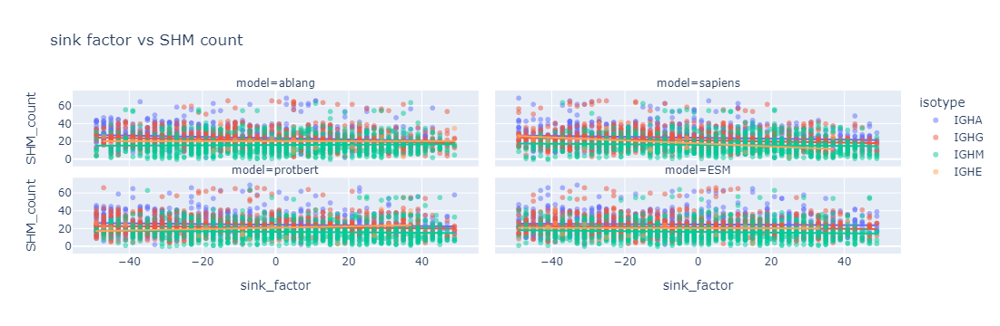

In [45]:
import plotly.express as px

fig = px.scatter(
    data_frame = output_table,
    facet_col = "model",
    facet_col_wrap = 2,
    x = "sink_factor",
    y = "SHM_count",
    trendline="ols",
    color="isotype",
    # trendline_color_override="red",
    opacity = 0.5,
    orientation = "v",
    title='sink factor vs SHM count',
)

fig.update_layout(height = 400 *int(len(model_names)/2))

fig.show()

### AntibodyForest Agreement Test 

In [67]:
import pandas as pd

sys.path.append("../src")

from ablang_model import Ablang
from antiberty_model import Antiberty
from ESM_model import ESM
from sapiens_model import Sapiens
from protbert import ProtBert

model_names = ["sapiens"]
model_classes = [Sapiens]

abforest_files_location = os.path.join("..","..","..","data",dataset,"clonal_analysis")

for j,model in enumerate(model_names):
    
    torch.cuda.empty_cache()
    
    file_names = os.listdir(os.path.join(abforest_files_location,model))
    clonotypes = list(set([x.split("-")[0] for x in file_names]))
    
    if model == "ablang":
        model_init = Ablang(chain="heavy")
    if model == "sapiens":
        model_init = Sapiens(chain_type="H")
    else:
        model_init = model_classes[j]()

    dict = {}

    for clonotype in clonotypes:
        
        model_folder = os.path.join(abforest_files_location,model)
        
        node_features = pd.read_csv(os.path.join(model_folder,f"{clonotype}-node_features.csv"))
        adj_mat = pd.read_csv(os.path.join(model_folder,f"{clonotype}-adj_mat.csv"))

        germline_index = node_features["label"].astype(int).max()
        
        node_features = node_features.loc[node_features["label"] != germline_index, :]
        adj_mat = adj_mat.loc[adj_mat["i"] != germline_index,:]
        
        num_edges = adj_mat.shape[0]

        mean_substitution_ranks_per_edge = []

        for i in range(adj_mat.shape[0]):
            
            seq_1 = node_features["network_sequences"][adj_mat.iloc[i,0] - 1]
            seq_2 = node_features["network_sequences"][adj_mat.iloc[i,1] - 1]

            diff_positions = [i for i in range(len(seq_1)) if seq_1[i] != seq_2[i]]
            prob_matrix = model_init.calc_probability_matrix(seq_1)
            
            substitute_ranks = []
            
            for pos in diff_positions:

                likelihood_values = pd.Series(prob_matrix.iloc[pos,:])
                ranks = likelihood_values.rank(ascending=False)

                substitute_ranks.append(ranks[seq_2[pos]])

            mean_substitute_rank = np.average(substitute_ranks)
            mean_substitution_ranks_per_edge.append(mean_substitute_rank)

        dict.update({f"{clonotype}":mean_substitution_ranks_per_edge})

    del(model_init)    
            
            

In [73]:
np.average(dict["s1_clonotype9"])

5.438095238095238